# Graded Challenge 2
Name : `Kamil Riyadi Alam Situmeang`

Batch : `FTDS009`

## I. Introduction

### I.1 Project Background
This is my second graded challenge in my journey to learn Datascience on Hacktiv8! kudos to me!

The objective of this project is to `applies` the concept from `Linear Algebra and Calculus in Image Processing.`

`The result` of this project will be an `image edge detection.`

The step of the process will be:
1. importing the image
2. channel filtering
3. grayscaling the image
4. calculating first partial derivative
5. calculating its magnitude
6. determining the threshold value
7. showing the result

I will try to elaborate each process of the step above as good as possible.

### I.2 Dataset Source
Image that will used for this project is taken from [here.](https://edition.cnn.com/2020/10/30/world/dog-dna-intl-scli-gbr-scn/index.html)

It's the first image appear before the article. (Rhodesian Ridgeback dog standing at the park)

## II. Importing Libraries
Since this project will work mostly with an image and  array of data, I will utilize `PIL` and `matplotlib` libraries.
Also, for calculation I will utilize `Numpy` and `Pandas`

In [1]:
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import pandas as pd


## III. Data Loading

### III.1 Import Image

First, to start the project let's import the image.

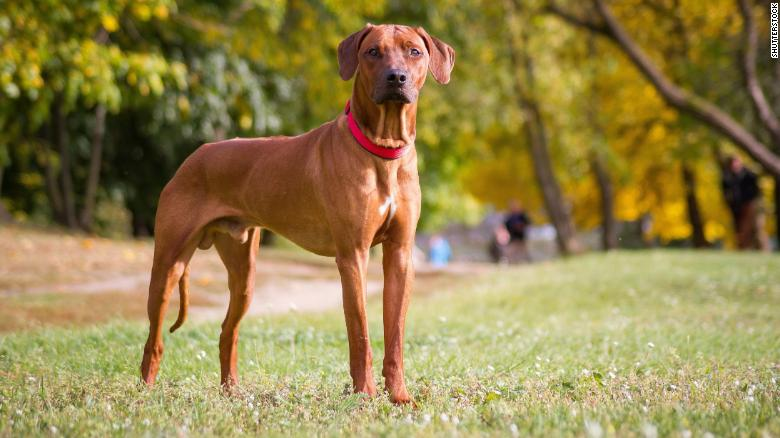

In [5]:
# Importing image using `PIL.Image`
image = Image.open('201030094143-stock-rhodesian-ridgeback-exlarge-169.jpg')

# Convert Image into Numpy Array
og_image = np.asarray(image)

# Show the imported image
image

In [12]:
og_image[:, :, :3].shape

(438, 780, 3)

### III.2  Image Data Exploration
Now let's see the dimension, shape, and see what how the image data is stored.

In [3]:
# Shows type of data
print(f'type of data :', type(og_image))

# Shows image dimension
print(f'Image dimension :', og_image.ndim)

# Shows image shape
print(f'Image shape :', og_image.shape)

#
print(f'Image mode :', image.mode)

type of data : <class 'numpy.ndarray'>
Image dimension : 3
Image shape : (438, 780, 3)
Image mode : RGB


From type of data, it tells us the data of this image is stored as an n-dimensional array

From image dimension, it tells us the array is a 3-dimensional array

From image shape, it tells us the image consist of 438 rows X 780 columns and each cell consist of 3 element

Or simply :
> The image has 438 px times
> 780 px,
> and each cell stores 3 values

Lastly, from image mode it tells us the image stored as RGB mode.

Then let's see the array of the image

In [4]:
# Shows stored image array
og_image

array([[[ 86,  93,  39],
        [ 86,  94,  37],
        [ 87,  90,  35],
        ...,
        [ 48,  41,  15],
        [ 46,  39,  11],
        [ 59,  52,  23]],

       [[ 77,  84,  30],
        [ 77,  84,  30],
        [ 78,  83,  27],
        ...,
        [ 46,  38,  15],
        [ 64,  57,  29],
        [ 37,  30,   1]],

       [[ 64,  73,  20],
        [ 66,  73,  19],
        [ 68,  73,  17],
        ...,
        [ 56,  48,  27],
        [ 46,  36,  11],
        [ 70,  60,  33]],

       ...,

       [[165, 150, 107],
        [159, 144, 101],
        [151, 134,  91],
        ...,
        [150, 138,  86],
        [149, 137,  85],
        [145, 134,  80]],

       [[164, 149, 108],
        [157, 142, 101],
        [149, 131,  91],
        ...,
        [155, 143,  93],
        [153, 141,  91],
        [148, 136,  84]],

       [[164, 149, 108],
        [157, 142, 101],
        [148, 130,  90],
        ...,
        [160, 148, 100],
        [157, 145,  95],
        [150, 138,  88]]

It's sure a whole lot of data stored in an array.

To get better explanation of this array, let's take a small portion on the array.

In [5]:
# Shows slice of the array, sliced at 1st row and 1st column
og_image[0,0,:]

array([86, 93, 39], dtype=uint8)

from above result it shows us `the first row of the first column has three element (values)`, which are [86, 93, 39].

So, what is this three elements has to do with the image?

`This three elements represent` colors in each cell (or pixel), represent `RGB color combination`. It's values range from 0 to 255.

First element [86], represent  Red color. Second element [93], represent Green color. and Third element [39], represent Blue color.

If We input those values into an [RGB color generator](https://coolors.co/gradient-maker/565d27-f7d486-f27a7d), We will get dark brown-ish color.

`Conclusion is the upper-left most pixel on the image shows dark brown-ish color.`

## IV. Data Cleaning
For this phase, I will do some channel filtering to divide the image into `Red`, `Green`, and `Blue` channel

### IV.1 Channel Filtering

Because the image data was stored in an array format, We can do slicing to the image.

Slicing the image is done to filter particular color channel from the image.

In [6]:
# Red Channel
Red = og_image[:,:,0]

# Green Channel
Green = og_image[:,:,1]

# Blue Channel
Blue = og_image[:,:,2]

Because the image was in `RGB` mode, the first channel is red, second channel is green, and the third channel is blue.

below are the result of channel filtering in our image.

Text(0.5, 1.0, 'Blue Channel')

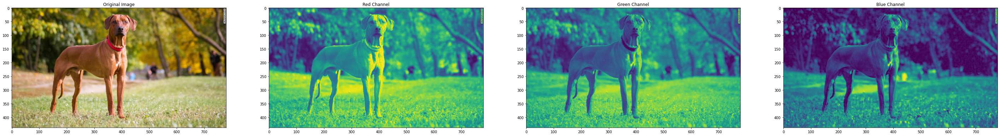

In [7]:
# Shows the result
fig, ax = plt.subplots(ncols=4,figsize=(50,10))

ax[0].imshow(og_image)
ax[0].set_title('Original Image')
ax[1].imshow(Red)
ax[1].set_title('Red Channel')
ax[2].imshow(Green)
ax[2].set_title('Green Channel')
ax[3].imshow(Blue)
ax[3].set_title('Blue Channel')

For a glance, it may be confusing what does this channel filtering does to the image?

Well, basically channel filtering shows us relatives connection between each colors in the image. 

you may notice that :
- `Red color related` object in original image, appear more brighter in red channel filter
- `Green color related` object in original image, appear more brighter in green channel filter
- `Blue color related` object in original image, appear more brighter in blue channel filter

Still confused? well let's see the diagram below

<img src="https://miro.medium.com/max/960/0*M7gh3UJv0qw-6MRw"
    alt = "Analogous Chart"
    style = 10px>

from the chart we can tell what color is related to each other, the usual term is `Analogous Color.`

So, in channel filtering, the color channel will shows color related object to be more brighter in the image.

### IV.2 Greyscaling the Image

Actually, for edge detection in an image, color in the image doesn't matter that much.

So, what does matter that much?

The answer is `Contrast.` In order to tell things apart, human see the differences in contrast of an object.

You may notice that there is a dog in the picture because the dog has `different colors` with the background.
Now, can you tell the differences between each grass in the picture? 

Probably not. why? because each grass has low `contrast` between each other. 

Now, `in order to show high contrast in the image`, We need to take out all colors and `turns the image into a Grayscale Image`

To achieve this,  We need to modify the RGB value from each channel.

The value modification follw these rule:
> Grayscale = (0.2989 * Red) + (0.5870 * Green) + (0.1140 * Blue)

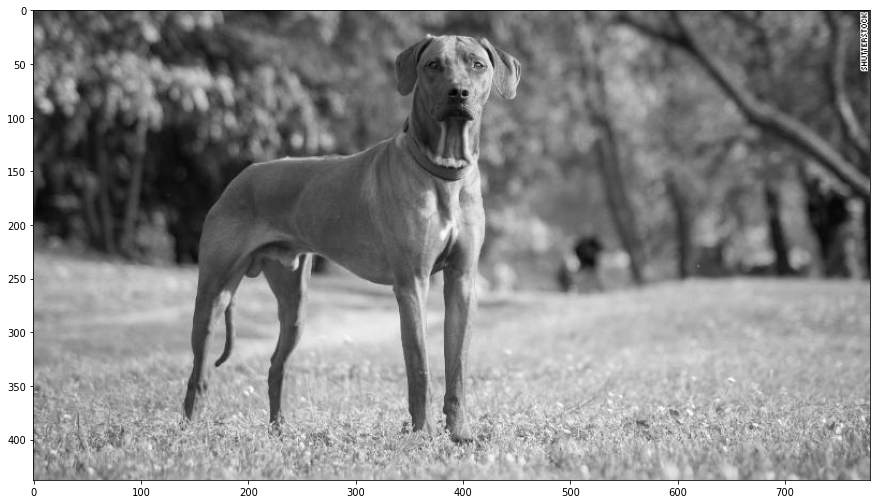

In [8]:
# Grayscaling an Image
Grayscale = 0.2989 * Red + 0.5870 * Green + 0.1140 * Blue

# Shows the result
plt.figure(figsize=(15,10))
plt.imshow(Grayscale, cmap='gray')
plt.show()

# Save the grayscaled image
plt.imsave('Grayscale.jpg', Grayscale, cmap='gray')


Below are comparisson between `Grayscale Image` for each color filter.

Text(0.5, 1.0, 'Blue Channel Grayscale')

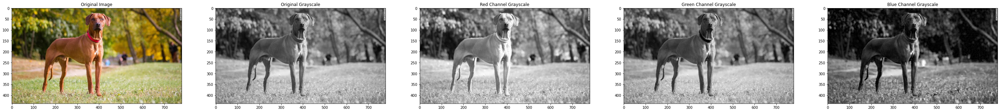

In [9]:
fig, ax = plt.subplots(ncols=5,figsize=(50,10))

ax[0].imshow(og_image)
ax[0].set_title('Original Image')
ax[1].imshow(Grayscale, cmap='gray')
ax[1].set_title('Original Grayscale')
ax[2].imshow(Red, cmap='gray')
ax[2].set_title('Red Channel Grayscale')
ax[3].imshow(Green, cmap='gray')
ax[3].set_title('Green Channel Grayscale')
ax[4].imshow(Blue, cmap='gray')
ax[4].set_title('Blue Channel Grayscale')

Notice although all image are in `Grayscale`, in different color channel shows different contrast in the image.

For further process of edge detection, I will use the `Original Grayscale` Image.

## V. Image Processing

### V.1 Calculate the Gradient

`Mathematically speaking, gradient (Partial Derivatives) represents the direction of most rapid change in intensity.`

So, how does it apply to edge detection in an image?

I already introduce the concept of `contrast` above. Contrast differentiate object one another.

By calculating gradient, We know the change in intensity a.k.a `contrast` of an object inside the image.

Now, let's see `gradient` in action!

Each pixel inside the matrix will be partially derived based on x- and y- directions. 

Text(0.5, 1.0, '$\\partial_y$')

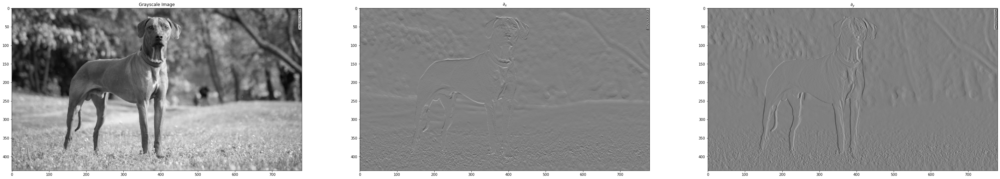

In [10]:
# Gradient Calculation
dx, dy = np.gradient(Grayscale)

# Shows the plot
fig, ax = plt.subplots(ncols=3,figsize=(50,10))
ax[0].imshow(Grayscale, cmap="gray")
ax[0].set_title('Grayscale Image')
ax[1].imshow(dx, cmap="gray")
ax[1].set_title(r'$\partial_x$')
ax[2].imshow(dy, cmap="gray")
ax[2].set_title(r'$\partial_y$')

From image above, by partially derivate the image matrix based on x- and y-direction, We can see the result is somewhat like embossed image.

notice that: 
- in `dx result`, it shows more apparent line in x-direction compared to `dy result`. Simply because, it only account for change in contrast in x-direction.
- in `dy result`, it shows more apparent line in y-direction compared to `dx result`. Simply because, it only account for change in contrast in y-direction.

### V.2 Calculate the Gradient Magnitude

`Gradient Magnitude` is sum of squares of the first partial derivatives (dx and dy).

`Gradient Magnitude takes account both partial derivatives` and combines it to shows us the change in intensity in both directions.

the formula of Magnitude is:

In [11]:
# Magnitude Formula
M = np.sqrt((dx**2)+(dy**2))

# Magnitude Calculation Result
M

array([[  9.00625792,   9.40711499,   8.10948047, ...,   2.82158203,
         18.77039112,  25.49350307],
       [ 10.2409    ,  10.18337462,   8.89397104, ...,   7.03893063,
          4.57655005,  27.49243488],
       [  8.75442845,   9.00921523,   8.02710161, ..., 107.55816582,
         15.26841692,  31.17691934],
       ...,
       [  6.0316038 ,   7.98741369,   9.7548047 , ...,   2.12698268,
          2.64941382,   3.63410764],
       [  7.0099328 ,   8.53982482,   8.65817564, ...,   5.24172812,
          5.47541517,   5.7426539 ],
       [  6.9993    ,   8.9937    ,   9.04911265, ...,   5.24552219,
          6.49189359,   7.34529055]])

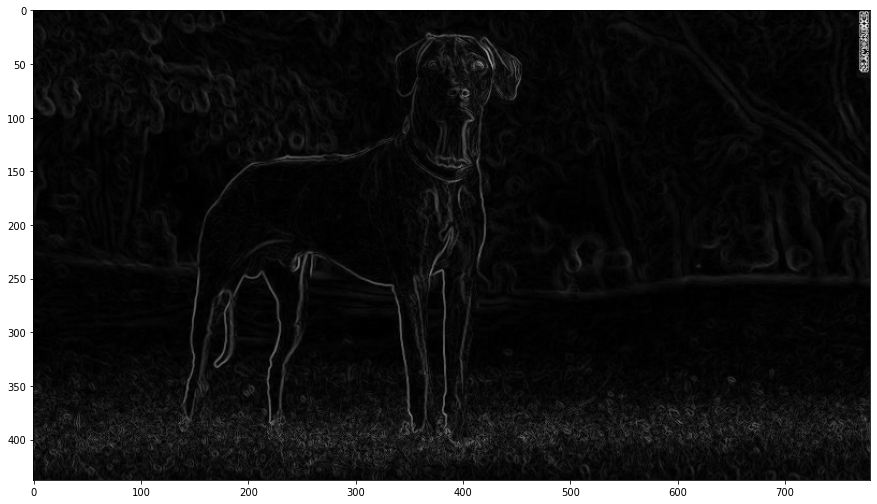

In [12]:
# Resultint Image
plt.figure(figsize=(15,10))
plt.imshow(M, cmap="gray")

From image above, We can see `Magnitude calculation of an image matrix resulting in a sktech-like image.`

This sketch-like image will be used as `basis of edge detection of an image.`

Now, think of this, what is actually this image want to shows us?

I assume the answers is this image want to shows a dog standing in the middle of a park.

So, the `main focus of the image is the dog.` We do not put much attention other than that. (at least for me)

From image above, We can see that the edge detection did not really focus on the dog only. It detects almost every edge of objects inside the image.

`So, how to focus the edge detection to the dog only?`

`We can utilize the edge threshold value!`

### V.3  Edge Threshold

What is Edge threshold means ?

Well, `Edge threshold determine wether a pixel in an image array is an edge or not.`

for this process We determine the threshold value then compare the image array with this value.

### V.4  Threshold Filtering Process

Below, I made a simple edge detection function based on certain edge threshold value.

In [13]:
# Edge_Detection Function

def edge_detect(img, thres):
    '''Function for edge detection, where
    img = image matrix,
    thres = desired threshold for edge detection
    '''

# turn image array into list
    flatten = img.flatten().tolist()

# filter the list
    filtered = []
    i = 0

    while i < len(flatten):
        if flatten[i] >= thres:
            filtered.append(255)
            i += 1
        else:
            filtered.append(0)
            i += 1
    
# return the list into a 2d array
    result = np.array(filtered).reshape((img.shape[0],img.shape[1]))
    
    return result



How this function works?

This function will `take matrix of an image` and `desired threshold value` and `return a new matrix based on threshold filtering`.

1. First, it convert the 2-dimensional array into 1-dimensional array and save it as a list.
2. Second, iterate through the list. Every `list[i] value` inside the list will be then compared to given threshold value.\
If `list[i] value` is `greater than or equal to the threshold` value then `255` will be put into the list.\
If `list[i] value` is `less than the threshold` value then `0` will be put into the list.\
Value `0 represent the darkest black` while, value `255 represent the brightest white` in color spectrum.\
In general, any pixel below the threshold level will be considered as black, and pixel above the threshold level will be considered white.
hence, based on contrast; the edge will be detected. 
3. Third, convert the list back into a 1-dimensional array, and reshape it into 2-dimensional array.


### V.5  Finding Optimum Threshold Value

Now let's find the optimum value for the image.

before determine the value, I want to know distribution of values in the image matrix.

In [14]:
# Exploring values distribution inside image matrix

# Convert image matrix into dataframe
df = pd.DataFrame(M)

# Determine minimum value inside dataframe
print(f'Min value : ',df.min().min())

# Determine maximum value inside dataframe
print(f'Max value : ',df.max().max())

# Determine mean value inside dataframe
print(f'Mean value : ',df.mean().mean())
print("="*30)

# Overall value distribution
print(df.describe(percentiles=[0.90]).T.mean())
print("="*30)



Min value :  0.0
Max value :  179.87161371948045
Mean value :  7.270105080577389
count    438.000000
mean       7.270105
std        7.707850
min        0.133395
50%        4.756055
90%       16.259729
max       52.318114
dtype: float64


From above result, We know that:
- Smallest value is 0
- Average smallest value is 0.133
- Highest value is 179.87
- Average highest value is 52.31
- Mean value is 7.27

Although, max value is 179.87 the average max value is 52.31. It is a huge difference. It shows the value is not well distributed.

We also know that min value and mean min value is close, so, I guess it really tells the truth.

mean of mean value inside the image matrix is 7.27.

If explanation by words is to hard to comprehend, let me explain it using images.

I will use 7 as base threshold value and will increment it with 7 and shows the difference between each threshold.

I use 7 because it is the mean of mean value of image data matrix.

In [15]:
#threshold = 7
thres1 = edge_detect(M, 7)

#threshold = 14
thres2 = edge_detect(M, 14)

#threshold = 21
thres3 = edge_detect(M, 21)

#threshold = 28
thres4 = edge_detect(M, 28)

#threshold = 35
thres5 = edge_detect(M, 35)

#threshold = 42
thres6 = edge_detect(M, 42)

#threshold = 49
thres7 = edge_detect(M, 49)

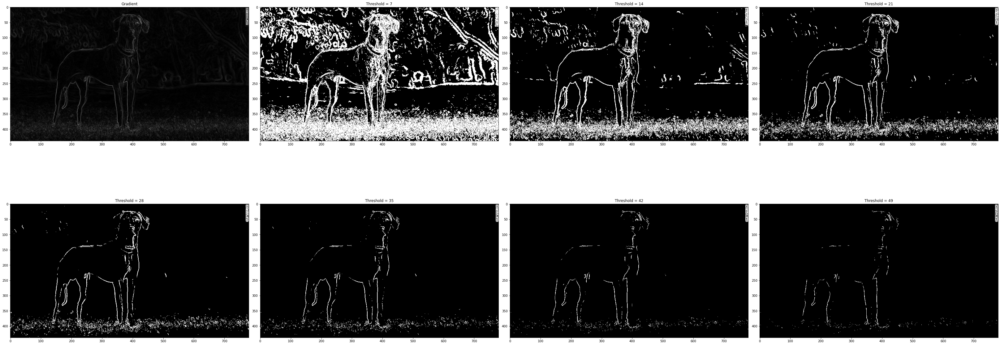

In [16]:
# Shows the plot
fig, ax = plt.subplots(nrows = 2, ncols= 4, figsize=(45, 20))

ax[0, 0].imshow(M, cmap="gray")
ax[0, 0].set_title('Gradient')
ax[0, 1].imshow(thres1, cmap="gray")
ax[0, 1].set_title('Threshold = 7')
ax[0, 2].imshow(thres2, cmap="gray")
ax[0, 2].set_title('Threshold = 14')
ax[0, 3].imshow(thres3, cmap="gray")
ax[0, 3].set_title('Threshold = 21')
ax[1, 0].imshow(thres4, cmap="gray")
ax[1, 0].set_title('Threshold = 28')
ax[1, 1].imshow(thres5, cmap="gray")
ax[1, 1].set_title('Threshold = 35')
ax[1, 2].imshow(thres6, cmap="gray")
ax[1, 2].set_title('Threshold = 42')
ax[1, 3].imshow(thres7, cmap="gray")
ax[1, 3].set_title('Threshold = 49')

fig.tight_layout()

Based on result above, I can say that on:
- threshold = 7, edge of `all object` in image `are harshly drawn.`It is too much detail.
- threshold = 14, edge of the `dog` in image `is well drawn.` Some object on the background is drawn too.
- threshold = 21, edge of the `dog` in image `is well drawn.` Object on the background is barely drawn.
- threshold = 28, edge of the `dog` in image `is faintly drawn.` Object on the background is barely drawn.
- threshold = 35 and up, edge of `all object` in image `are barely drawn.` Did not give clear information about what is in the image.

Because our main focus is detecting the dog in the image, I can say the best threshold value will be in range of between 21 and 28.

Let's iterate the process one more time.

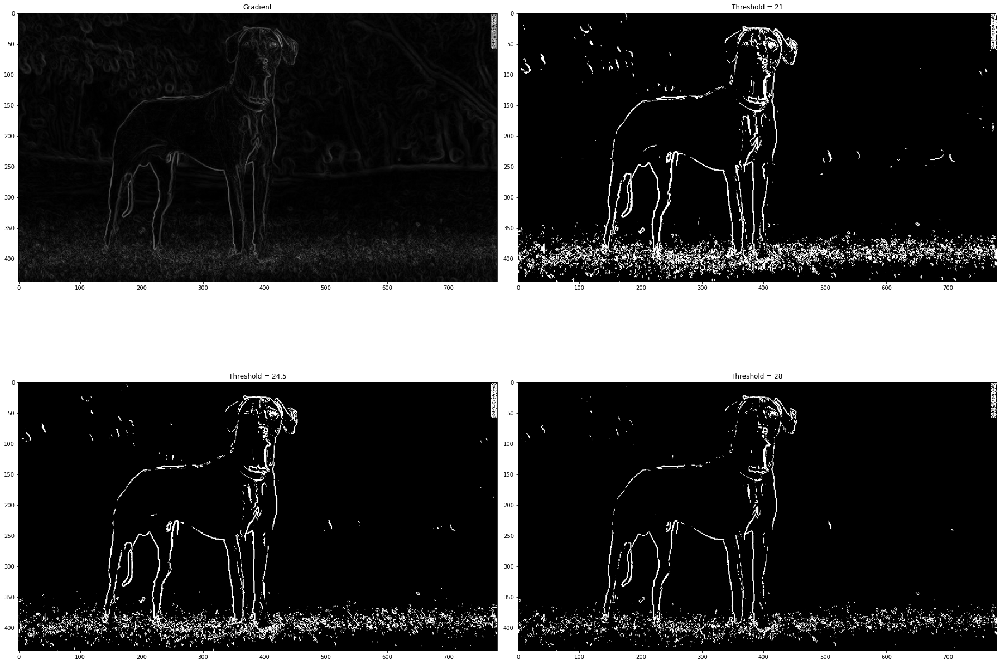

In [17]:
#threshold = 24.5 <-- middle value between 21 and 28
thres_opt = edge_detect(M, 24.5)

# Shows the plot
fig, ax = plt.subplots(nrows = 2, ncols= 2, figsize=(25, 20))

ax[0, 0].imshow(M, cmap="gray")
ax[0, 0].set_title('Gradient')
ax[0, 1].imshow(thres3, cmap="gray")
ax[0, 1].set_title('Threshold = 21')
ax[1, 0].imshow(thres_opt, cmap="gray")
ax[1, 0].set_title('Threshold = 24.5')
ax[1, 1].imshow(thres4, cmap="gray")
ax[1, 1].set_title('Threshold = 28')

fig.tight_layout()

On the final result, using threshold = 24.5 gives us clear edge detection for the dog.

### V.6  Matrix Multiplication

In this section, I want to play around with the image matrix of the result above and multiply it with another matrix or scalar\
and see what it does to the result matrix.

In [18]:
# Hadamard Product
Hadamard = thres_opt * (-1)

In [19]:
# Dot Product
Dot = thres_opt @ Grayscale.T

Text(0.5, 1.0, 'Dot Product')

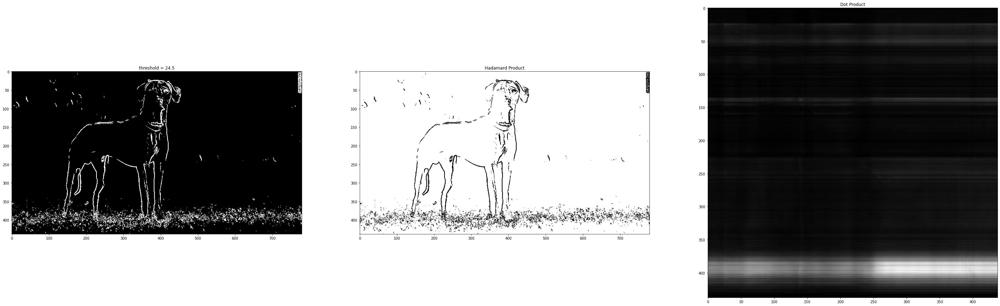

In [20]:
# Shows the plot
fig, ax = plt.subplots(ncols = 3, figsize=(50, 20))

ax[0].imshow(thres_opt, cmap="gray")
ax[0].set_title('threshold = 24.5')
ax[1].imshow(Hadamard, cmap="gray")
ax[1].set_title('Hadamard Product')
ax[2].imshow(Dot, cmap="gray")
ax[2].set_title('Dot Product')


Based on result above: 
- By multiplying our result matrix with scalar value of -1 with Hadamard product, it resulting in invertion of color of the image, from black into white
- By multiplying our result matrix with our transposed grayscale matrix with Dot product, well, it resulting in nothing useful :(

## VI. Conclusion

Finally we get to the conclusion. My conclusion for this project is I am `successfully applies` the concept from `Linear Algebra and Calculus in Image Processing.` The `edge of object in the image are detected pretty well.`

So here are the comparisson between threshold value:

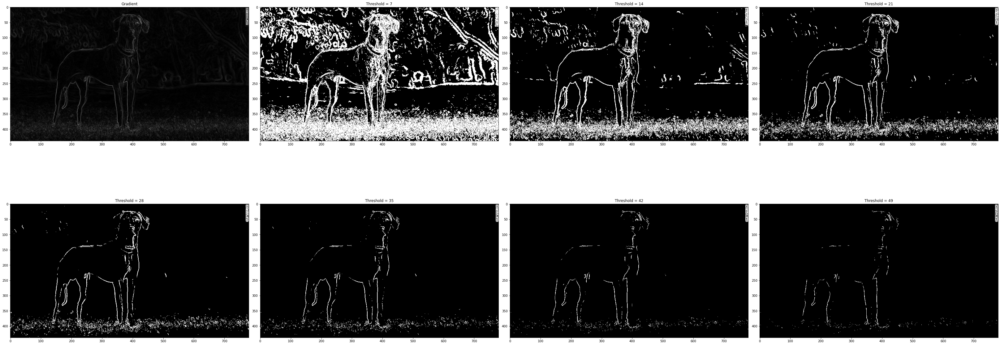

In [21]:
# Shows the plot
fig, ax = plt.subplots(nrows = 2, ncols= 4, figsize=(45, 20))

ax[0, 0].imshow(M, cmap="gray")
ax[0, 0].set_title('Gradient')
ax[0, 1].imshow(thres1, cmap="gray")
ax[0, 1].set_title('Threshold = 7')
ax[0, 2].imshow(thres2, cmap="gray")
ax[0, 2].set_title('Threshold = 14')
ax[0, 3].imshow(thres3, cmap="gray")
ax[0, 3].set_title('Threshold = 21')
ax[1, 0].imshow(thres4, cmap="gray")
ax[1, 0].set_title('Threshold = 28')
ax[1, 1].imshow(thres5, cmap="gray")
ax[1, 1].set_title('Threshold = 35')
ax[1, 2].imshow(thres6, cmap="gray")
ax[1, 2].set_title('Threshold = 42')
ax[1, 3].imshow(thres7, cmap="gray")
ax[1, 3].set_title('Threshold = 49')

fig.tight_layout()

My Opnion from the results are:
- threshold = 7, edge of `all object` in image `are harshly drawn.` It is too much detail.
- threshold = 14, edge of the `dog` in image `is well drawn.` Some object on the background is drawn too.
- threshold = 21, edge of the `dog` in image `is well drawn.` Object on the background is barely drawn.
- threshold = 28, edge of the `dog` in image `is faintly drawn.` Object on the background is barely drawn.
- threshold = 35 and up, edge of `all object` in image `are barely drawn.` Did not give clear information about what is in the image.

The higher the threshold, barely the edge of an object is detected. So, I can say the best threshold value will be in range of between 21 and 28. `My personal choice for threshold value is 24.5.`

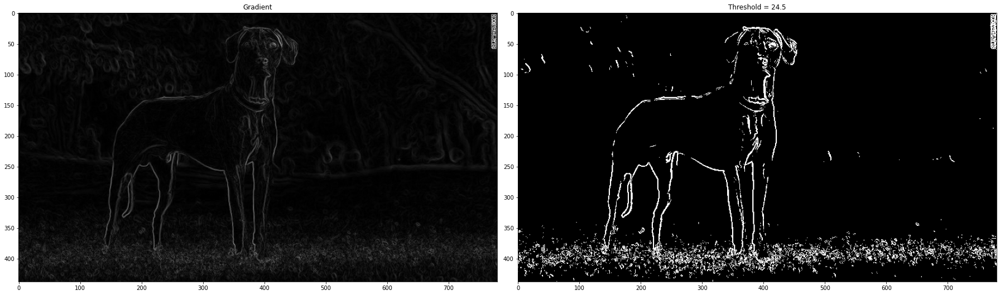

In [22]:
#threshold = 24.5 <-- middle value between 21 and 28
thres_opt = edge_detect(M, 24.5)

# Shows the plot
fig, ax = plt.subplots(ncols=2, figsize=(25, 20))

ax[0].imshow(M, cmap="gray")
ax[0].set_title('Gradient')
ax[1].imshow(thres_opt, cmap="gray")
ax[1].set_title('Threshold = 24.5')

fig.tight_layout()

Beside determining a threshold value, I decided to play around too.

I tried to multiply the result matrix with:
- a scalar value using Hadamard Product
- another matrix using Dot Product

and here is the results

In [23]:
# Hadamard Product
Hadamard = thres_opt * (-1)

In [24]:
# Dot Product
Dot = thres_opt @ Grayscale.T

Text(0.5, 1.0, 'Dot Product')

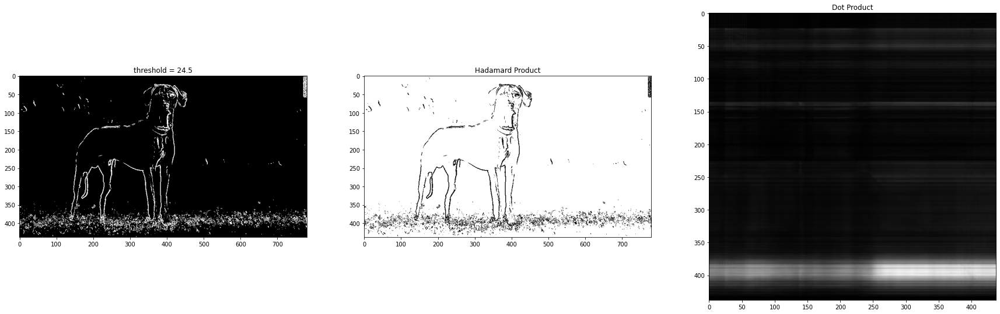

In [25]:
# Shows the plot
fig, ax = plt.subplots(ncols = 3, figsize=(30, 20))

ax[0].imshow(thres_opt, cmap="gray")
ax[0].set_title('threshold = 24.5')
ax[1].imshow(Hadamard, cmap="gray")
ax[1].set_title('Hadamard Product')
ax[2].imshow(Dot, cmap="gray")
ax[2].set_title('Dot Product')

Based on result above: 
- By multiplying our result matrix with scalar value of -1 with Hadamard product, it resulting in invertion of color of the image, from black into white
- By multiplying our result matrix with our transposed grayscale matrix with Dot product, well, it resulting in nothing useful :(